In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

from enum import Enum
from typing import Any, List

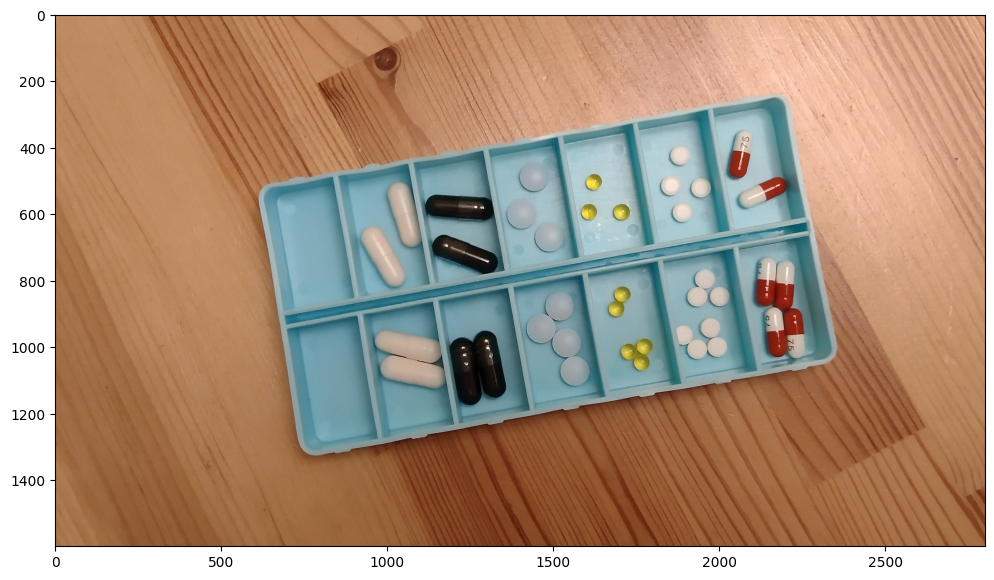

In [2]:
calib = cv2.imread('dane/calib.png')
plt.subplots(1, 1, figsize=(12,8))[1].imshow(calib[..., ::-1]);

In [3]:
class PillType(Enum):
    PROBIO = 1    # duże białe kapsułki
    CARBON = 2    # duże czarne kapsułki
    KETO = 3      # niebieskie tabletki
    ESPU = 4      # małe żółte kapsułki
    BIOX = 5      # małe białe tabletki
    LINE = 6      # czerwono-białe kapsułki (klasa trudna - realizacja opcjonalna)

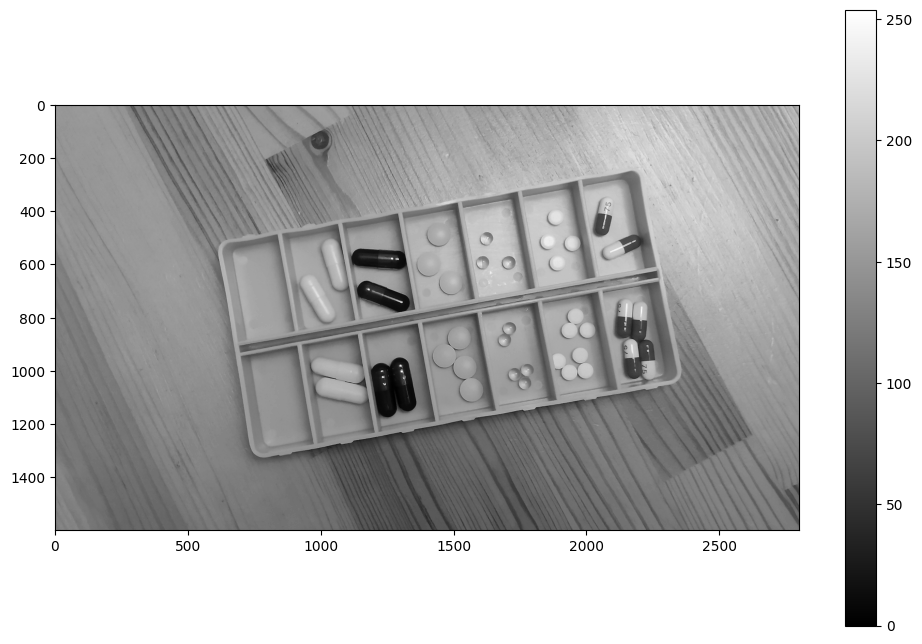

In [4]:
plt.figure(figsize=(12,8))
calib_gray = cv2.cvtColor(calib, cv2.COLOR_BGR2GRAY)
gr = plt.imshow(calib_gray, cmap='gray')
plt.colorbar(gr)
plt.show()

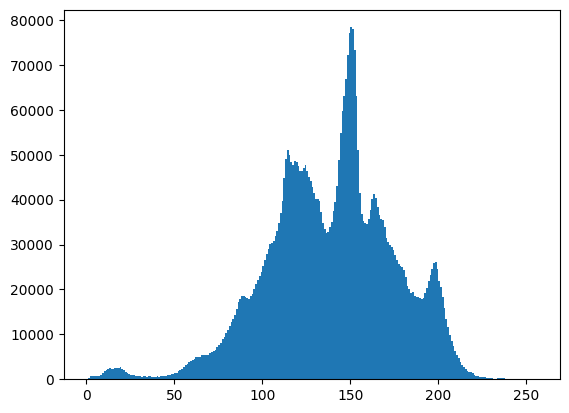

In [5]:
hist_values = calib_gray.ravel()
plt.hist(hist_values, bins=256, range=[0,256]);

# Extraction

## Black ones

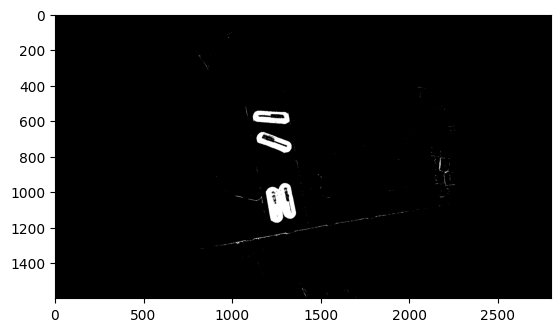

In [6]:
thresholded_black = cv2.threshold(calib_gray, 40, 255, cv2.THRESH_BINARY_INV)[1]
plt.imshow(thresholded_black, cmap='gray');

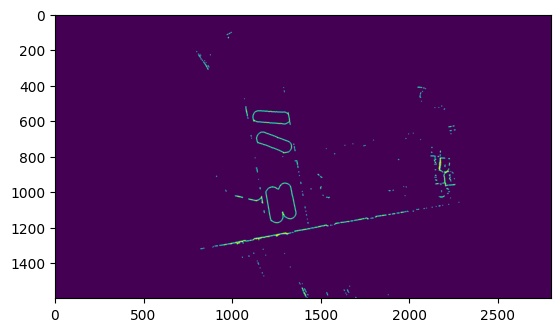

In [7]:
contours, hierarchy = cv2.findContours(thresholded_black, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
display = np.zeros_like(thresholded_black)
cv2.drawContours(display, contours, -1, (255, 255, 0), 3)
plt.imshow(display);

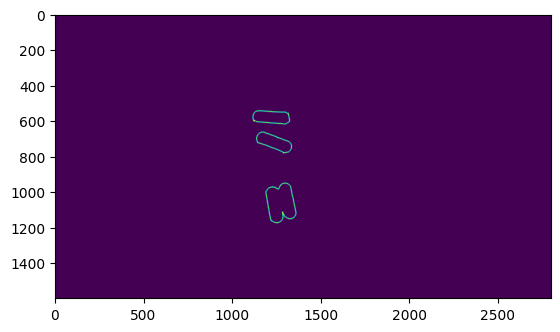

In [8]:
display = np.zeros_like(thresholded_black)
correct = [c for c in contours if c.shape[0] > 200]
cv2.drawContours(display, correct, -1, (255, 255, 0), 3)
plt.imshow(display);

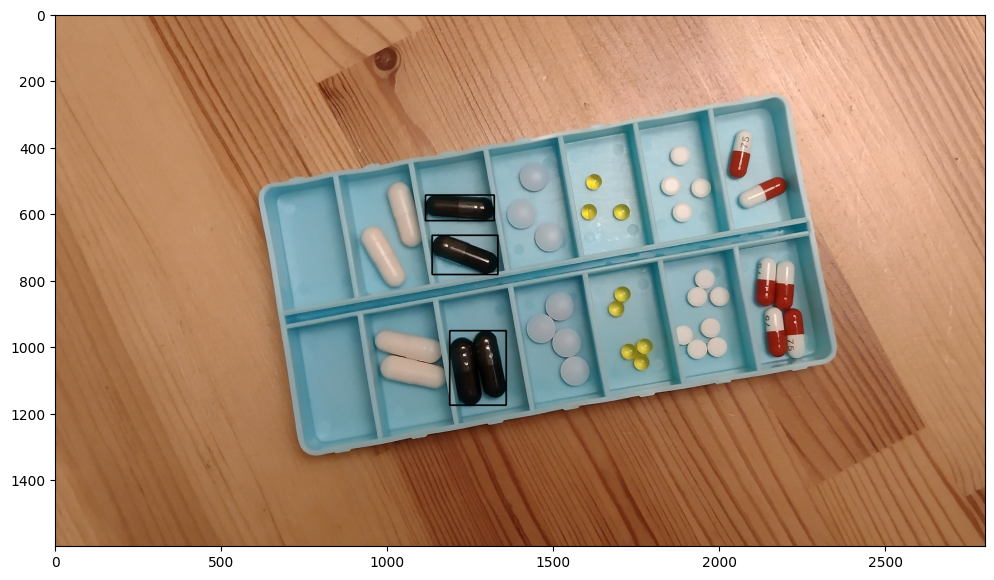

In [9]:
plt.figure(figsize=(12,8))
image = calib.copy()
for c in correct:
    x, y, w, h = cv2.boundingRect(c)
    cv2.rectangle(image, (x, y), (x+w, y+h), (0, 0, 0), 3)

plt.imshow(image[..., ::-1]);

### Detect connected ones

In [10]:
for c in correct:
    print(cv2.contourArea(c))

27244.5
12582.5
12410.0


In [11]:
connected = [c for c in correct if cv2.contourArea(c) > 20000]

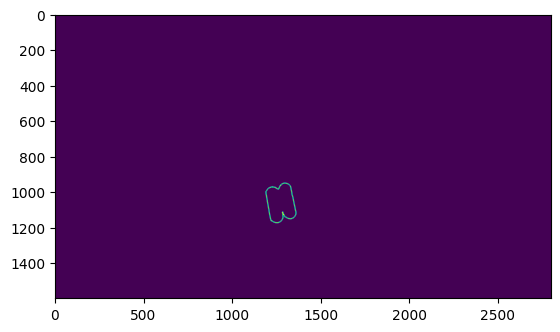

In [12]:
display = np.zeros_like(thresholded_black)
cv2.drawContours(display, connected, 0, (255, 255, 0), 3)
plt.imshow(display);

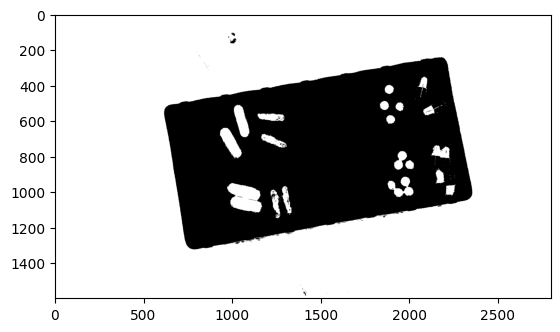

In [13]:
h,s,v = cv2.split(cv2.cvtColor(calib, cv2.COLOR_BGR2HSV))
mask_h = cv2.inRange(h, 8, 19)
plt.imshow(mask_h, cmap='gray');

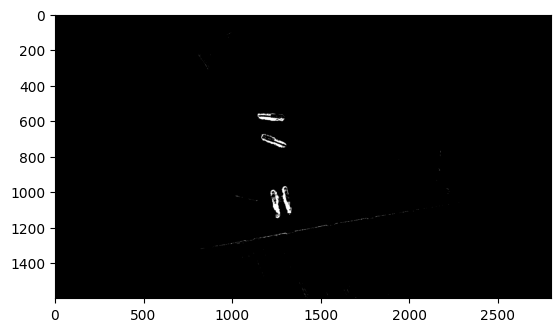

In [14]:
balck_mask = cv2.bitwise_and(thresholded_black, mask_h)
# balck_mask = cv2.dilate(balck_mask, (5,5), iterations=15)
plt.imshow(balck_mask, cmap='gray');

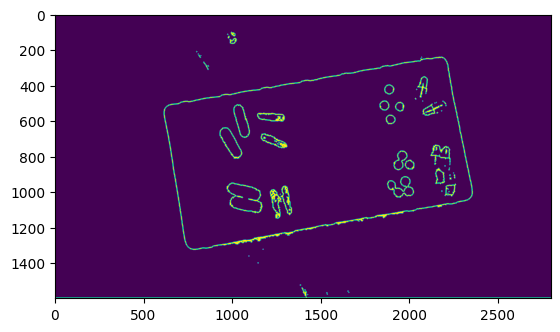

In [15]:
# image_32sc1 = np.int32(image)
contours = cv2.findContours(np.int32(mask_h), cv2.RETR_FLOODFILL, cv2.CHAIN_APPROX_SIMPLE)[0]
plt.imshow(cv2.drawContours(np.zeros_like(calib_gray), contours, -1, 255, 3));

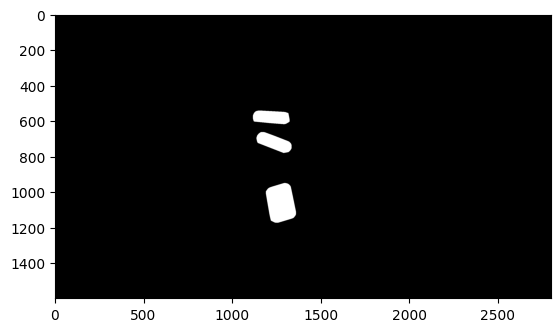

In [16]:
black_hull_mask = np.zeros_like(balck_mask)
for contour in correct:
    # Get the convex hull of the contour
    hull = cv2.convexHull(contour)
    # Draw and fill the convex hull
    cv2.drawContours(black_hull_mask, [hull], -1, 255, thickness=cv2.FILLED)
plt.imshow(black_hull_mask, cmap='gray');

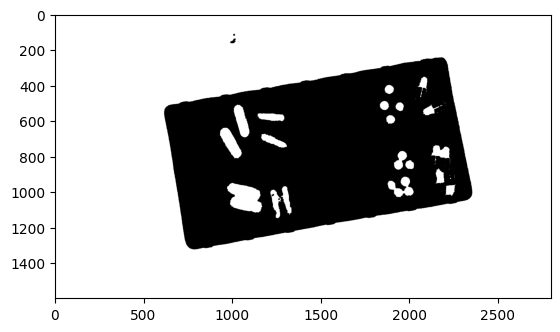

In [17]:
kernel = np.ones((7,7), np.uint8)
mask_h = cv2.morphologyEx(mask_h, cv2.MORPH_CLOSE, kernel)
plt.imshow(mask_h, cmap='gray');

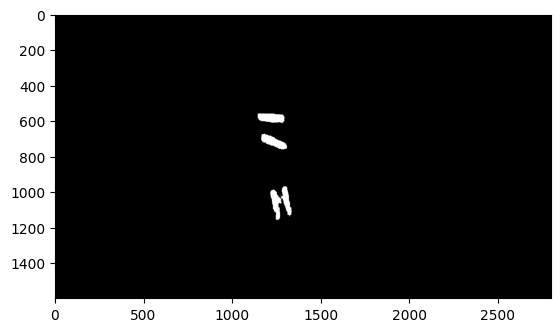

In [18]:
balck_mask = cv2.bitwise_and(black_hull_mask, mask_h)
balck_mask = cv2.dilate(balck_mask, (5,5), iterations=10)
plt.imshow(balck_mask, cmap='gray');

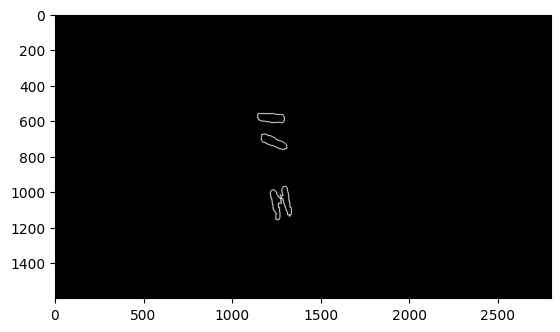

In [19]:
contours = cv2.findContours(balck_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]
display = np.zeros_like(balck_mask)
cv2.drawContours(display, contours, -1, (255, 255, 0), 3)
plt.imshow(display, cmap='gray');

In [20]:
len(contours)
for c in contours:
    print(cv2.contourArea(c))

0.0
5629.0
4896.5
6375.5
6500.0


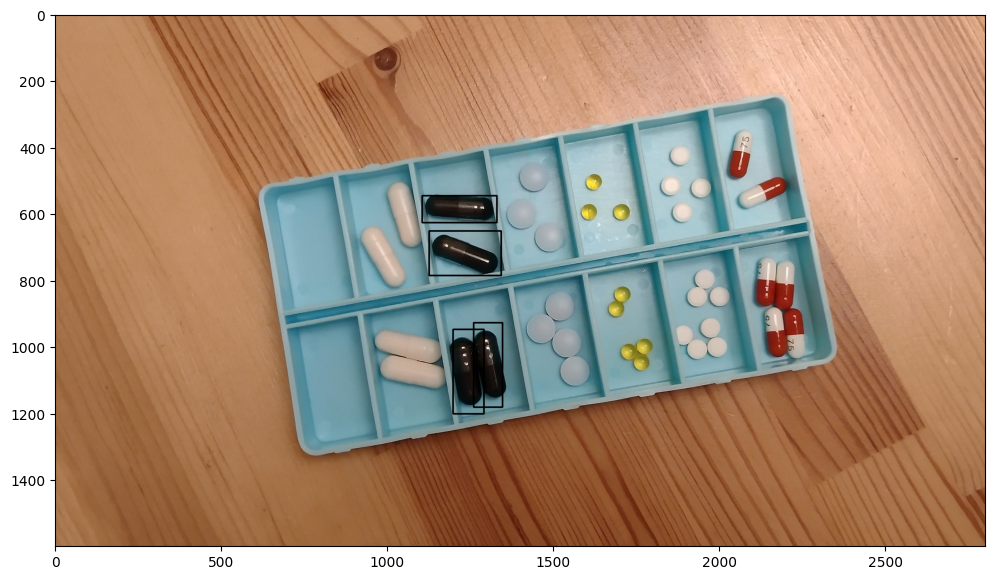

In [21]:
plt.figure(figsize=(12,8))
image = calib.copy()
for c in contours:
    x, y, w, h = cv2.boundingRect(c)
    cv2.rectangle(image, (x-int(w/4), y-int(h/4)), (x+w+int(w/4), y+h+int(h/4)), (0, 0, 0), 3)

plt.imshow(image[..., ::-1]);

# Color spaces

In [22]:
calib_lab = cv2.cvtColor(calib, cv2.COLOR_BGR2LAB)
calib_hsv = cv2.cvtColor(calib, cv2.COLOR_BGR2HSV)
calib_hls = cv2.cvtColor(calib, cv2.COLOR_BGR2HLS)
calib_yuv = cv2.cvtColor(calib, cv2.COLOR_BGR2YUV)

## RGB

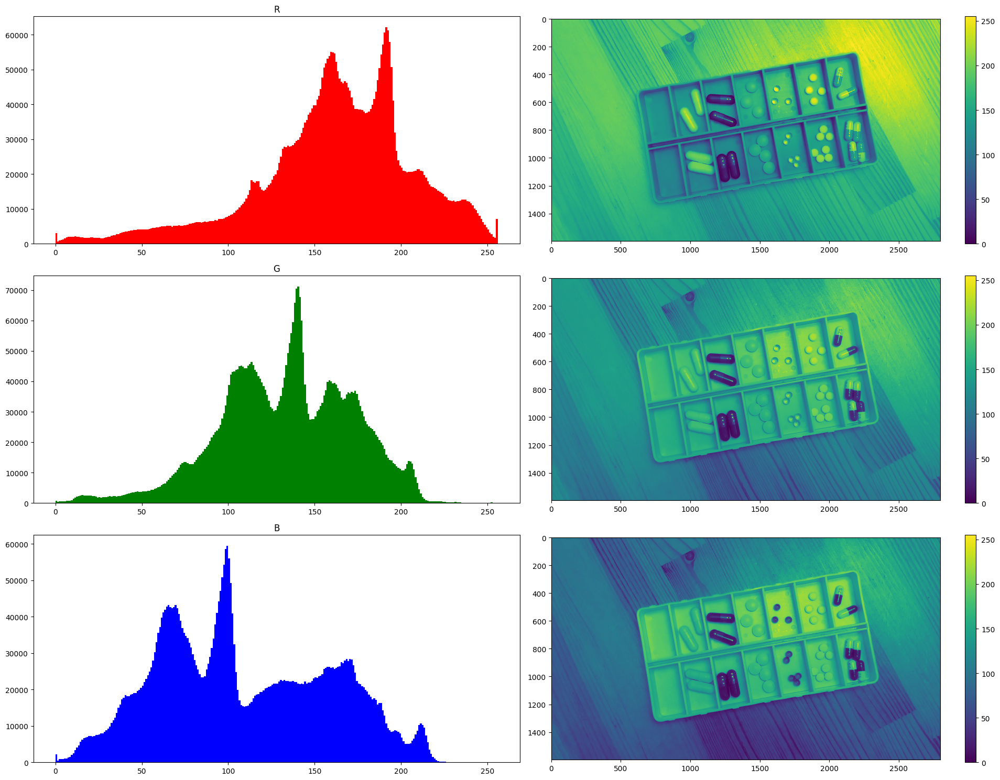

In [23]:
b,g,r = cv2.split(calib)
plt.figure(figsize=(20,15))
plt.subplot(3,2,1)
plt.hist(r.ravel(),256,[0,256], color='red')
plt.title('R')
plt.subplot(3,2,2)
ym = plt.imshow(r)
plt.colorbar(ym)
plt.subplot(3,2,3)
plt.hist(g.ravel(),256,[0,256], color='green')
plt.title('G')
plt.subplot(3,2,4)
um = plt.imshow(g)
plt.colorbar(um)
plt.subplot(3,2,5)
plt.hist(b.ravel(),256,[0,256], color='blue')
plt.title('B')
plt.subplot(3,2,6)
vm = plt.imshow(b)
plt.colorbar(vm)

plt.tight_layout()
plt.show()


## YUV

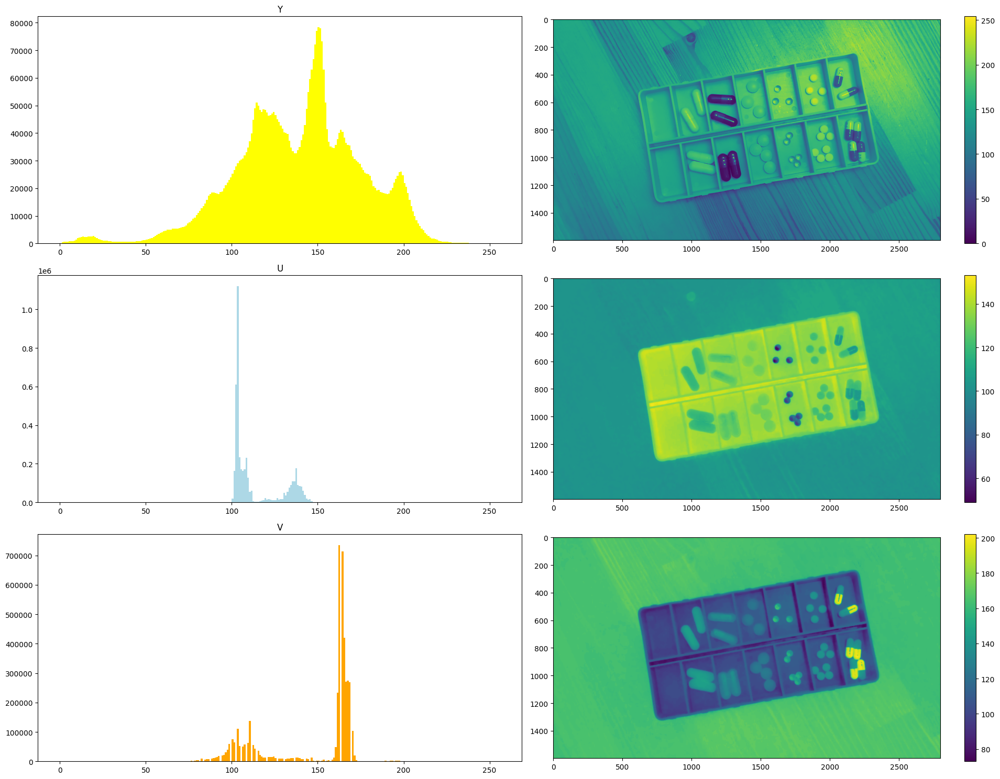

In [24]:
y,u,v = cv2.split(calib_yuv)
plt.figure(figsize=(20,15))
plt.subplot(3,2,1)
plt.hist(y.ravel(),256,[0,256], color='yellow')
plt.title('Y')
plt.subplot(3,2,2)
ym = plt.imshow(y)
plt.colorbar(ym)
plt.subplot(3,2,3)
plt.hist(u.ravel(),256,[0,256], color='lightblue')
plt.title('U')
plt.subplot(3,2,4)
um = plt.imshow(u)
plt.colorbar(um)
plt.subplot(3,2,5)
plt.hist(v.ravel(),256,[0,256], color='orange')
plt.title('V')
plt.subplot(3,2,6)
vm = plt.imshow(v)
plt.colorbar(vm)

plt.tight_layout()
plt.show()

YUV do detekcji żółtych

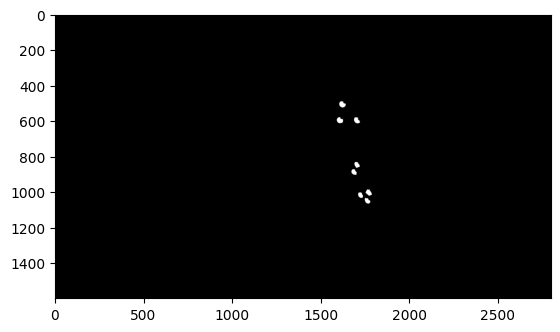

In [25]:
thresholded = cv2.threshold(u, 80, 255, cv2.THRESH_BINARY_INV)[1]
plt.imshow(thresholded, cmap='gray');

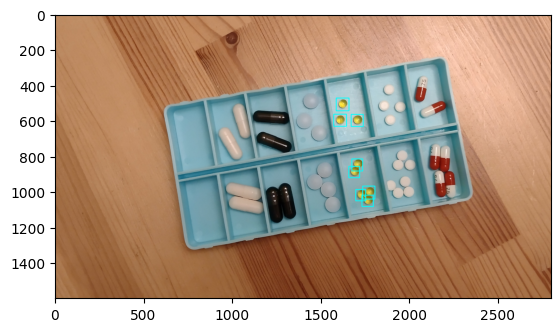

In [26]:
contours, _ = cv2.findContours(thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
image = calib.copy()
for c in contours:
    x, y, w, h = cv2.boundingRect(c)
    cv2.rectangle(image, (x-int(w/2), y-int(h/2)), (x+w+int(w/2), y+h+int(h/2)), (255, 255, 0), 3)

plt.imshow(image[..., ::-1]);

## HSV

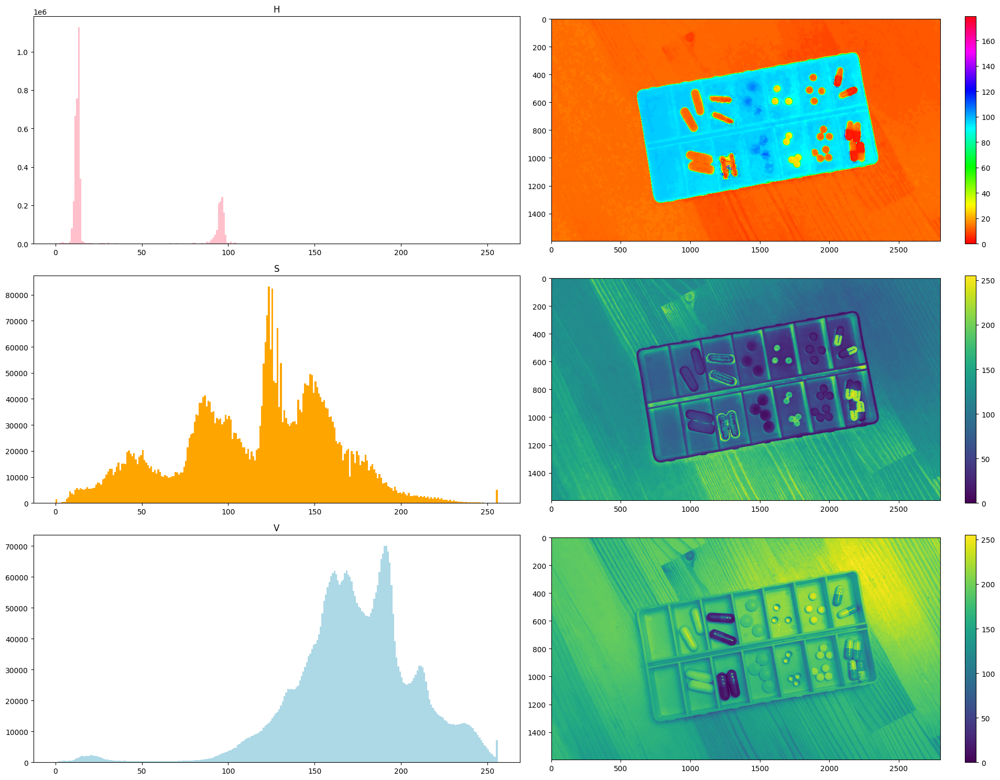

In [27]:
h,s,v = cv2.split(calib_hsv)
plt.figure(figsize=(20,15))
plt.subplot(3,2,1)
plt.hist(h.ravel(),256,[0,256], color='pink')
plt.title('H')
plt.subplot(3,2,2)
ym = plt.imshow(h, cmap='hsv')
plt.colorbar(ym)
plt.subplot(3,2,3)
plt.hist(s.ravel(),256,[0,256], color='orange')
plt.title('S')
plt.subplot(3,2,4)
um = plt.imshow(s)
plt.colorbar(um)
plt.subplot(3,2,5)
plt.hist(v.ravel(),256,[0,256], color='lightblue')
plt.title('V')
plt.subplot(3,2,6)
vm = plt.imshow(v)
plt.colorbar(vm)

plt.tight_layout()
plt.show()

Może do detekcji niebieskich?

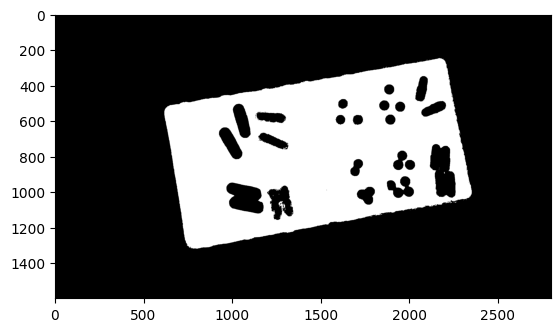

In [28]:
thresholded = cv2.threshold(h, 80, 255, cv2.THRESH_BINARY)[1]
plt.imshow(thresholded, cmap='gray');

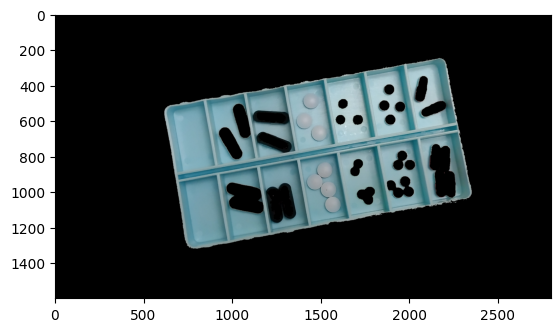

In [29]:
only_blue = cv2.bitwise_and(calib, calib, mask=thresholded)
plt.imshow(only_blue[..., ::-1]);

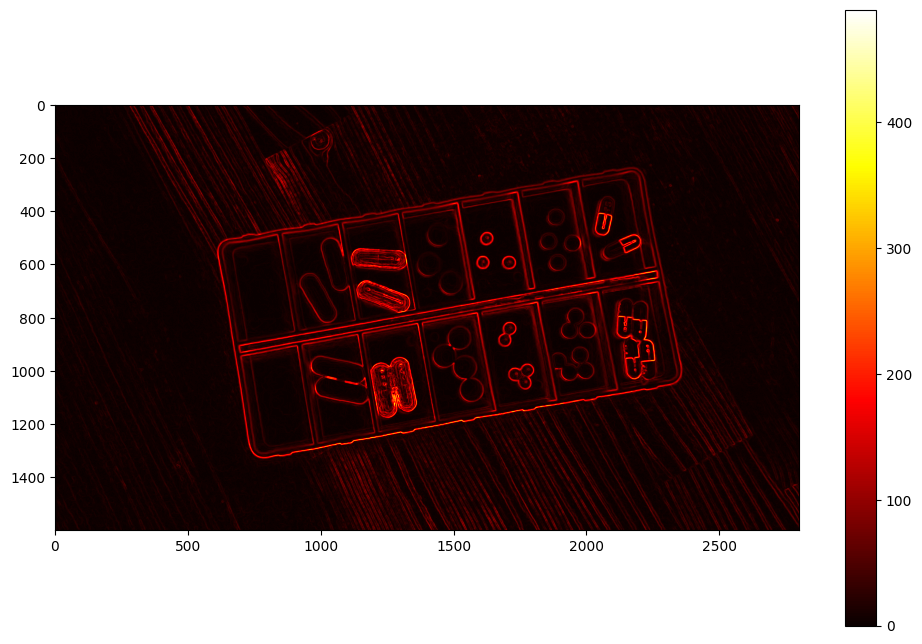

In [30]:
plt.figure(figsize=(12,8))
gaussian = cv2.GaussianBlur(s, (7, 7), 0)
sobelx = cv2.Sobel(src=gaussian, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=3)
sobely = cv2.Sobel(src=gaussian, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=3)
G = np.sqrt((sobelx**2) + (sobely**2))
im = plt.imshow(G, cmap='hot')
plt.colorbar(im)

### Boxes

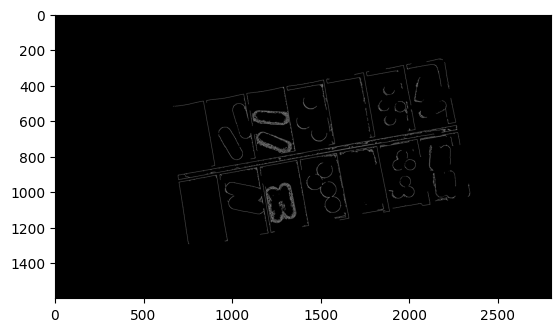

In [31]:
canny = cv2.Canny(s, 50, 150)
canny_masked = cv2.bitwise_and(canny, thresholded)
plt.imshow(canny_masked, cmap='gray');

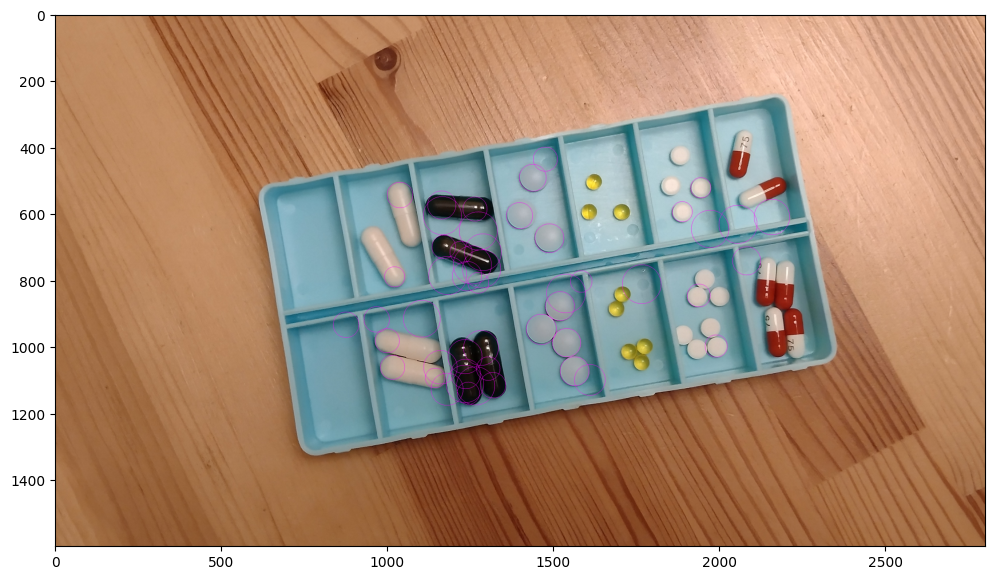

In [32]:
plt.figure(figsize=(12,8))
img_copy = calib.copy()
circles = cv2.HoughCircles(canny_masked, method = cv2.HOUGH_GRADIENT, dp = 1, minDist=30, param1=150, param2=16,minRadius=30, maxRadius=60)
if circles is not None:
        circles = np.uint16(np.around(circles))
        for i in circles[0, :]:
            center1 = (i[0], i[1])
            radius1 = i[2]
            # print(center1, radius1)
            cv2.circle(img_copy, center1, radius1, (255, 0, 255), 1)
plt.imshow(img_copy[..., ::-1]);

## HLS

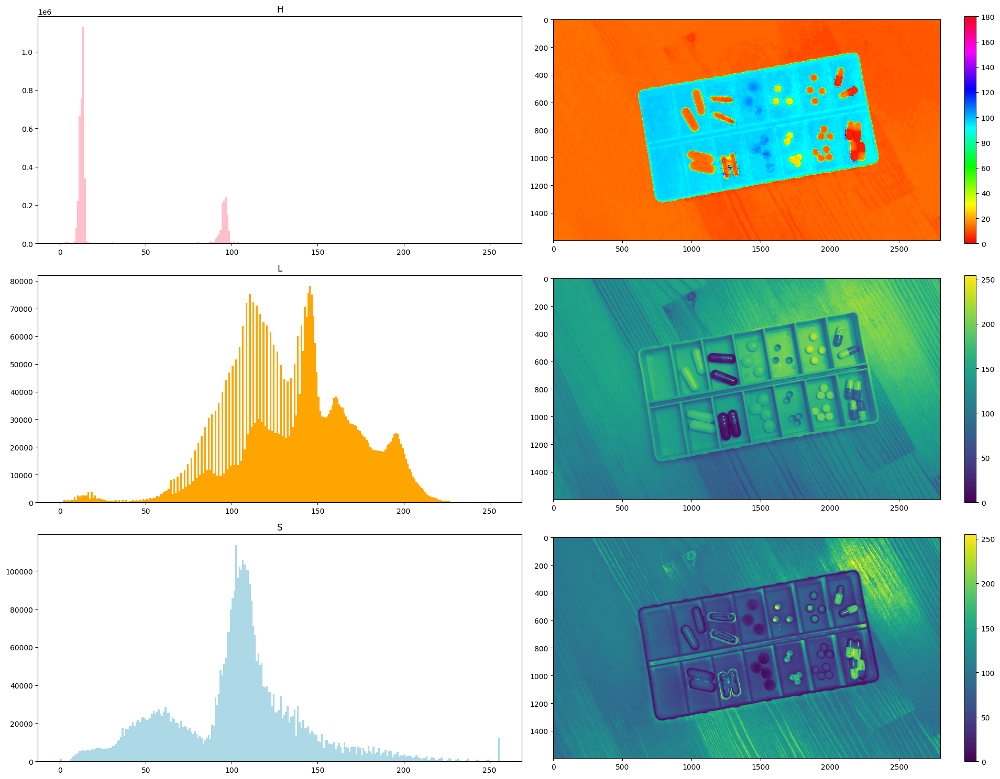

In [33]:
h,l,s = cv2.split(calib_hls)
plt.figure(figsize=(20,15))
plt.subplot(3,2,1)
plt.hist(h.ravel(),256,[0,256], color='pink')
plt.title('H')
plt.subplot(3,2,2)
ym = plt.imshow(h, cmap='hsv')
plt.colorbar(ym)
plt.subplot(3,2,3)
plt.hist(l.ravel(),256,[0,256], color='orange')
plt.title('L')
plt.subplot(3,2,4)
um = plt.imshow(l)
plt.colorbar(um)
plt.subplot(3,2,5)
plt.hist(s.ravel(),256,[0,256], color='lightblue')
plt.title('S')
plt.subplot(3,2,6)
vm = plt.imshow(s)
plt.colorbar(vm)

plt.tight_layout()
plt.show()

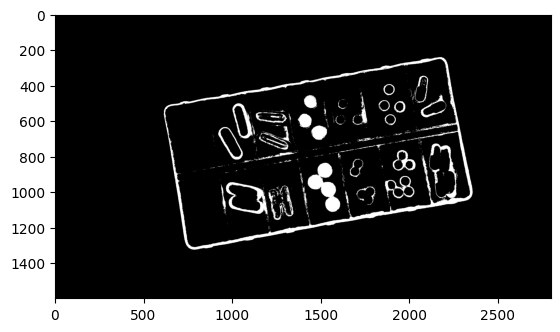

In [34]:
thresholded = cv2.threshold(s, 35, 255, cv2.THRESH_BINARY_INV)[1]
plt.imshow(thresholded, cmap='gray');

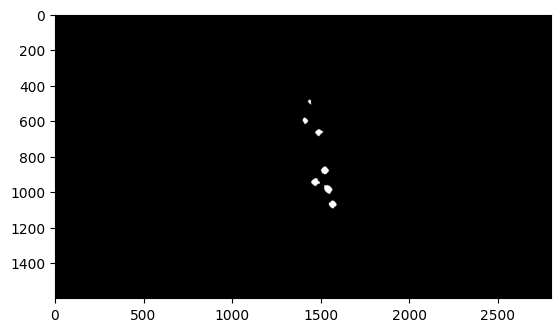

In [35]:
eroded = cv2.erode(thresholded, np.ones((5,5), np.uint8), iterations=8)
plt.imshow(eroded, cmap='gray');

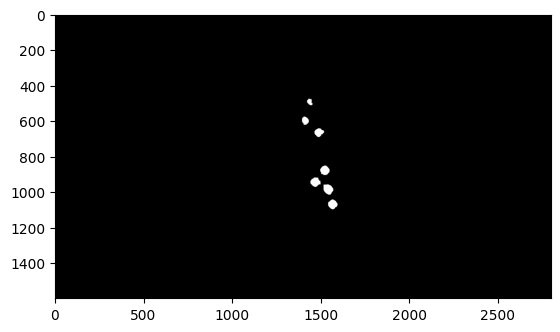

In [36]:
dilated = cv2.dilate(eroded, np.ones((5,5), np.uint8), iterations=2)
plt.imshow(dilated, cmap='gray');

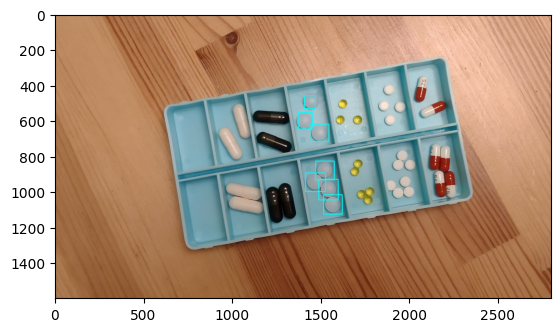

In [37]:
contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
# print(np.array(contours).shape)
image = calib.copy()
for c in contours:
    x, y, w, h = cv2.boundingRect(c)
    cv2.rectangle(image, (x-int(w/2), y-int(h/2)), (x+w+int(w/2), y+h+int(h/2)), (255, 255, 0), 3)

plt.imshow(image[..., ::-1]);

## LAB

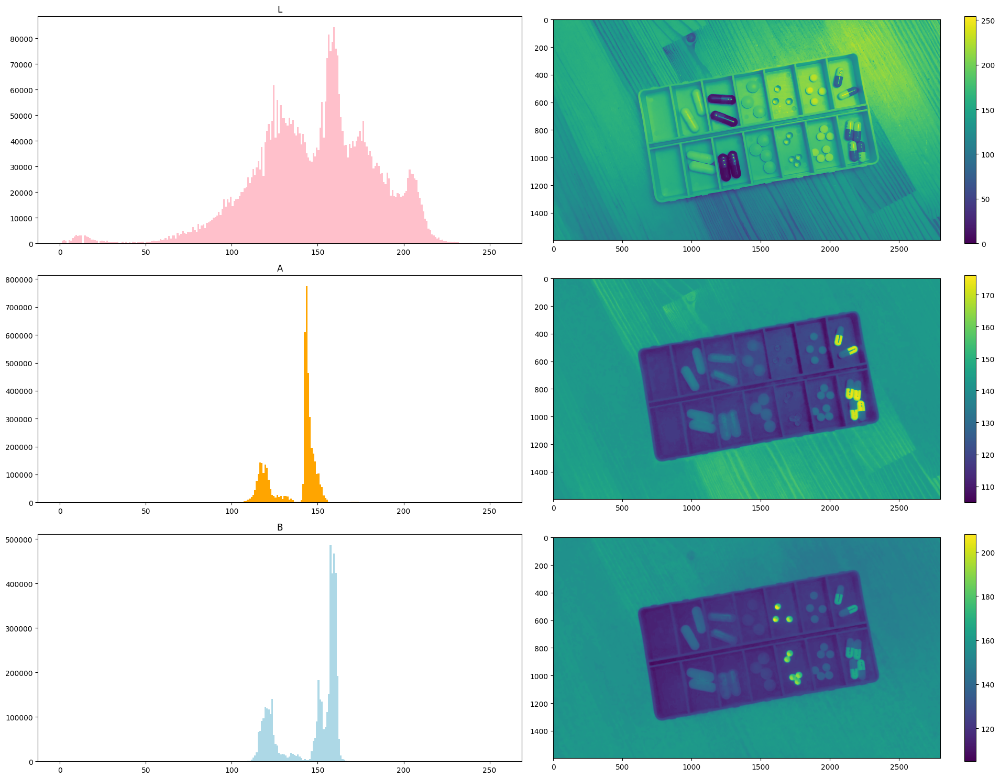

In [38]:
l,a,b = cv2.split(calib_lab)
plt.figure(figsize=(20,15))
plt.subplot(3,2,1)
plt.hist(l.ravel(),256,[0,256], color='pink')
plt.title('L')
plt.subplot(3,2,2)
ym = plt.imshow(l)
plt.colorbar(ym)
plt.subplot(3,2,3)
plt.hist(a.ravel(),256,[0,256], color='orange')
plt.title('A')
plt.subplot(3,2,4)
um = plt.imshow(a)
plt.colorbar(um)
plt.subplot(3,2,5)
plt.hist(b.ravel(),256,[0,256], color='lightblue')
plt.title('B')
plt.subplot(3,2,6)
vm = plt.imshow(b)
plt.colorbar(vm)

plt.tight_layout()
plt.show()

# white

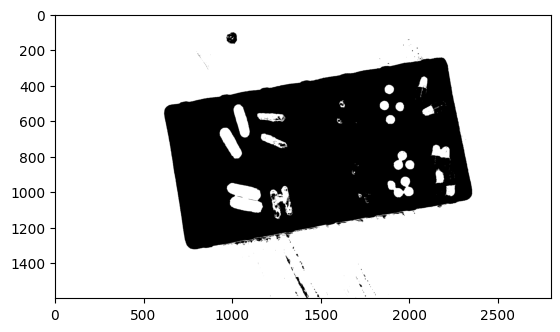

In [39]:
h,s,v = cv2.split(calib_hsv)
mask_h = cv2.inRange(h, 9, 25)
plt.imshow(mask_h, cmap='gray');

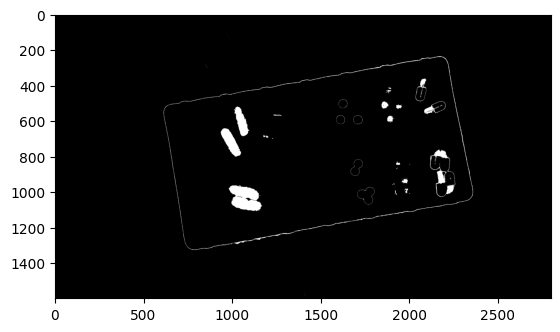

In [40]:
y,u,v = cv2.split(calib_yuv)
mask_u = cv2.inRange(u, 115, 120)
plt.imshow(mask_u, cmap='gray');

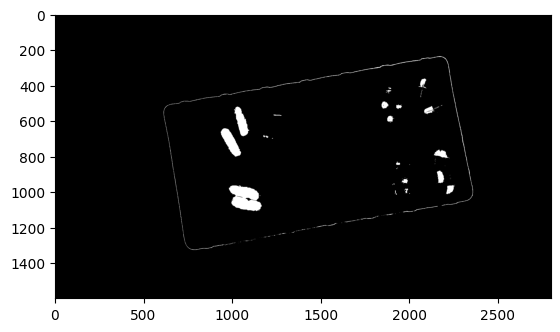

In [41]:
mask_hu = cv2.bitwise_and(mask_h, mask_u)
plt.imshow(mask_hu, cmap='gray');

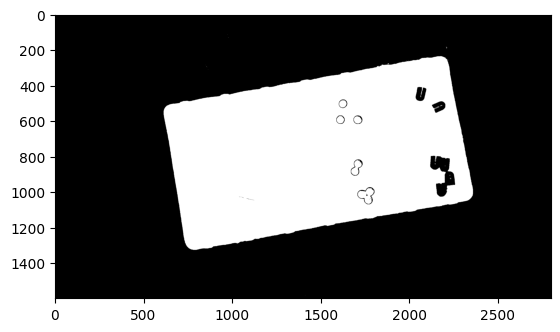

In [42]:
mask_b = ~cv2.inRange(b, 145, 170)
plt.imshow(mask_b, cmap='gray');

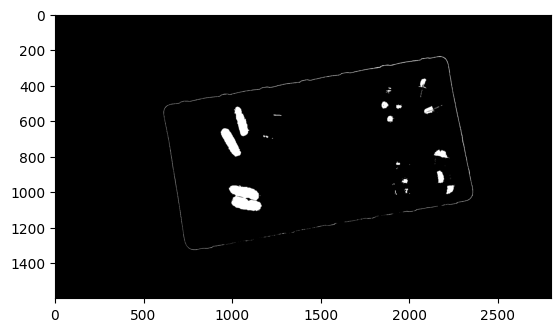

In [43]:
mask_hub = cv2.bitwise_and(mask_hu, mask_b)
plt.imshow(mask_hub, cmap='gray');

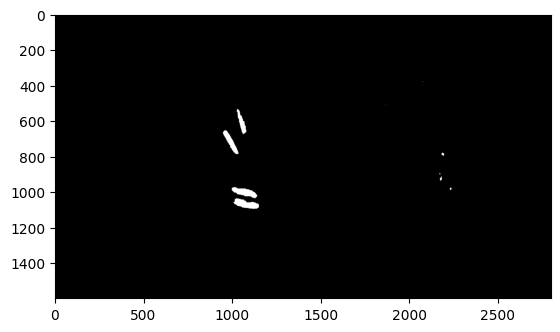

In [44]:
eroded = cv2.erode(mask_hub, np.ones((3,3), np.uint8), iterations=9)
plt.imshow(eroded, cmap='gray');

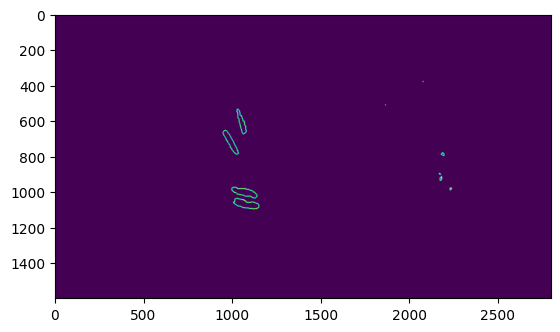

In [45]:
contours, _ = cv2.findContours(eroded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
plt.imshow(cv2.drawContours(np.zeros_like(b), contours, -1, (255, 255, 0), 3));

In [46]:
conts = []
for c in contours:
    conts.append(cv2.contourArea(c))

print(sorted(conts))

[1.0, 2.0, 24.5, 80.0, 147.5, 152.0, 2912.0, 3829.5, 4593.0, 4859.5]


In [47]:
white_pills = [c for c in contours if cv2.contourArea(c) > 1000]

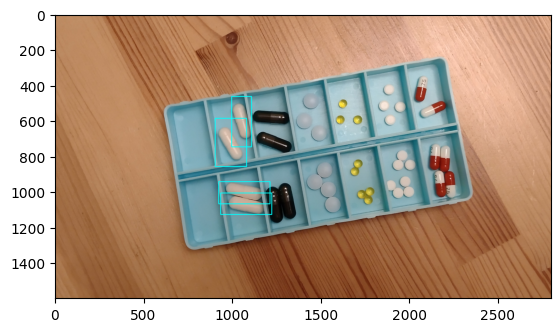

In [48]:
image = calib.copy()
for c in white_pills:
    x, y, w, h = cv2.boundingRect(c)
    cv2.rectangle(image, (x-int(w/2), y-int(h/2)), (x+w+int(w/2), y+h+int(h/2)), (255, 255, 0), 3)
plt.imshow(image[..., ::-1]);

## White small

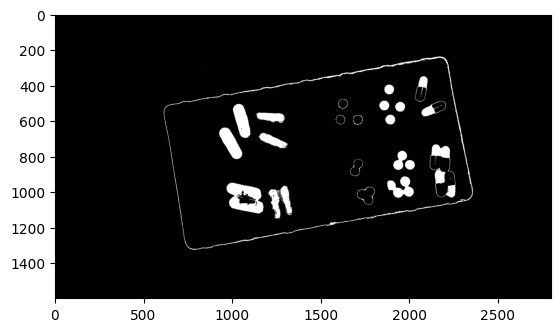

In [49]:
mask_b = cv2.inRange(b, 130, 140)
plt.imshow(mask_b, cmap='gray');

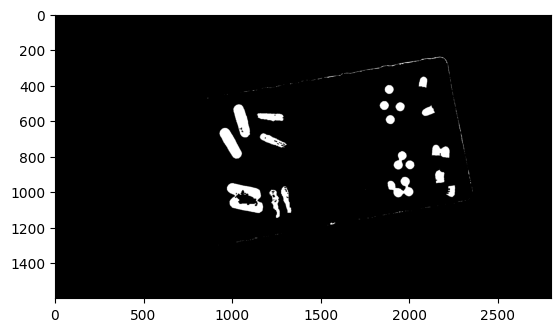

In [50]:
edored = cv2.erode(mask_b, np.ones((3,3), np.uint8), iterations=2)
plt.imshow(edored, cmap='gray');

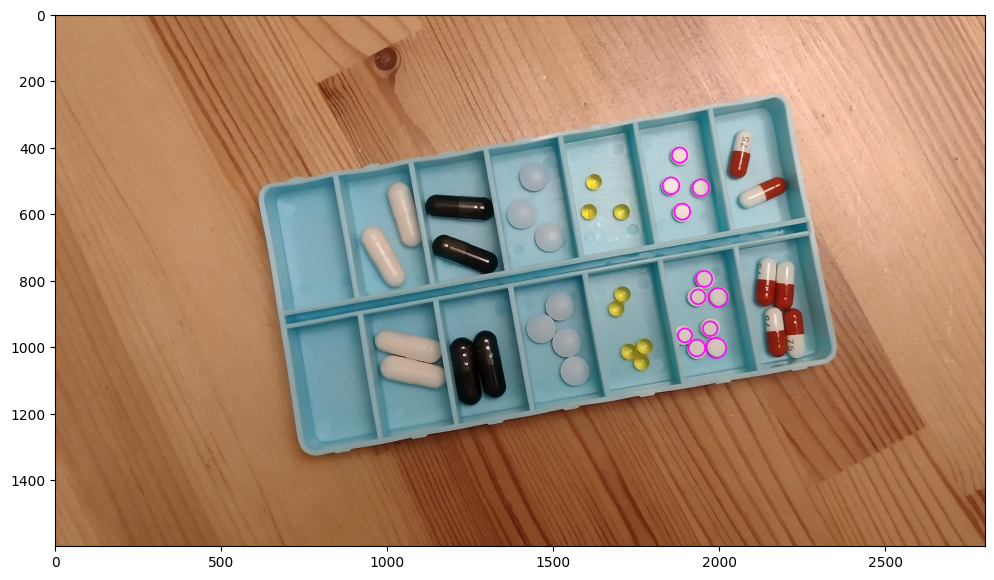

In [51]:
plt.figure(figsize=(12,8))
img_copy = calib.copy()
circles = cv2.HoughCircles(edored, method = cv2.HOUGH_GRADIENT, dp = 1, minDist=30, param1=200, param2=12,minRadius=20, maxRadius=40)
if circles is not None:
        circles = np.uint16(np.around(circles))
        for i in circles[0, :]:
            center1 = (i[0], i[1])
            radius1 = i[2]
            # print(center1, radius1)
            cv2.circle(img_copy, center1, radius1, (255, 0, 255), 3)
plt.imshow(img_copy[..., ::-1]);

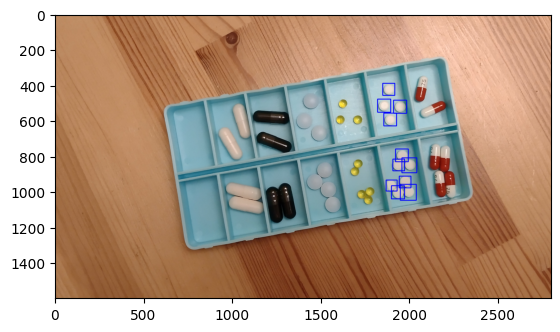

In [52]:
image = calib.copy()
circles = cv2.HoughCircles(edored, method = cv2.HOUGH_GRADIENT, dp = 1, minDist=30, param1=200, param2=12,minRadius=20, maxRadius=40)
if circles is not None:
        circles = np.uint16(np.around(circles))
        for i in circles[0, :]:
            x, y = i[0], i[1]
            # center1 = (i[0], i[1])
            radius1 = i[2]
            # print(center1, radius1)
            # cv2.circle(display, center1, radius1, 255, 3)
            # cv2.rectangle(image, (center1[0]-radius1, center1[1]-radius1), (center1[0]+radius1, center1[1]+radius1), 255, 3)
            cv2.rectangle(image, (x-radius1-int(radius1/2), y-radius1-int(radius1/2)), (x+int(1.5*radius1), y+int(1.5*radius1)), 255, 3)

# contours, _ = cv2.findContours(display, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
# plt.imshow(cv2.drawContours(np.zeros_like(calib_gray), contours, -1, (255, 255, 0), 3), cmap='gray');
plt.imshow(image[..., ::-1]);

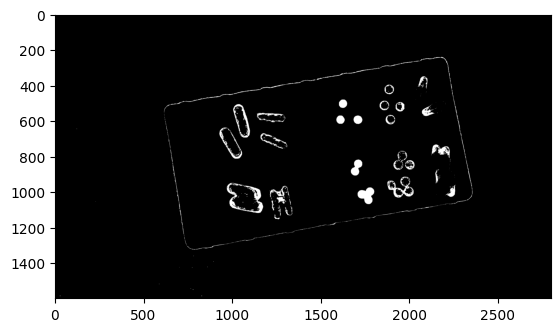

In [53]:
h,s,v = cv2.split(calib_hsv)
hue_mask = cv2.inRange(h, 15, 35)
plt.imshow(hue_mask, cmap='gray');

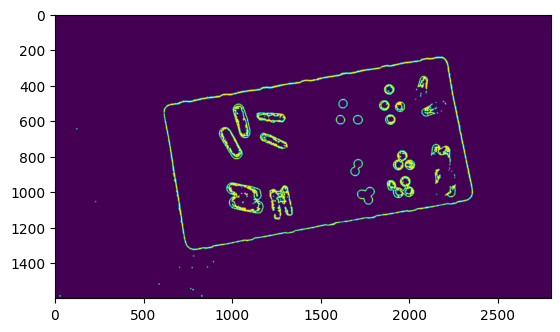

In [54]:
contours, _ = cv2.findContours(np.int32(hue_mask), cv2.RETR_FLOODFILL, cv2.CHAIN_APPROX_SIMPLE)
plt.imshow(cv2.drawContours(np.zeros_like(hue_mask), contours, -1, 255, 3));

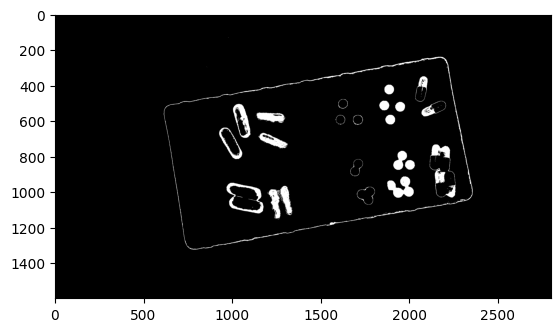

In [55]:
mask_b = cv2.inRange(b, 130, 137)
plt.imshow(mask_b, cmap='gray');

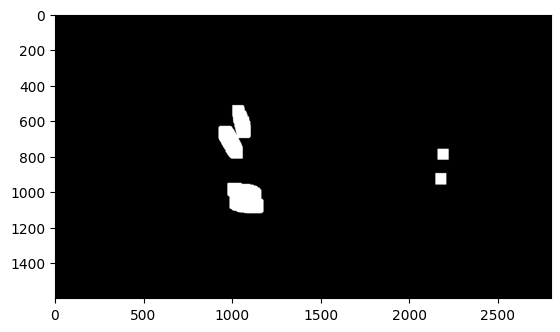

In [56]:
eroded_white = eroded.copy()
# plt.imshow(eroded_white, cmap='gray');
eroded_white = cv2.erode(eroded_white, np.ones((5,5), np.uint8), iterations=2)
eroded_white = cv2.dilate(eroded_white, np.ones((5,5), np.uint8), iterations=15)
plt.imshow(eroded_white, cmap='gray');

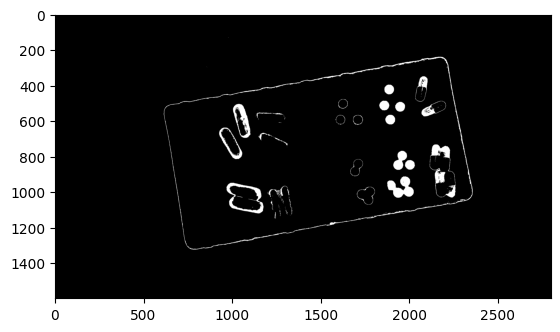

In [57]:
black_mask = balck_mask.copy()
mask = cv2.bitwise_and(~black_mask, mask_b)
plt.imshow(mask, cmap='gray');

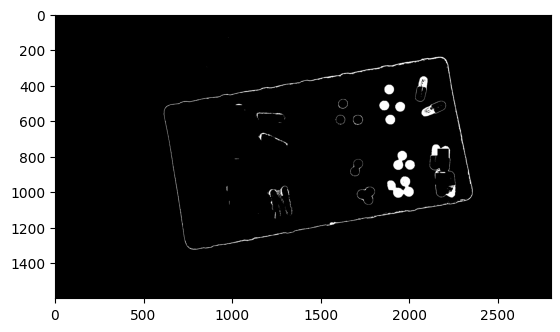

In [58]:
mask_v2 = cv2.bitwise_and(mask, ~eroded_white)
plt.imshow(mask_v2, cmap='gray');

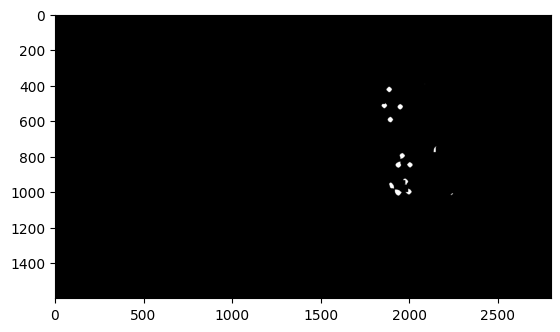

In [59]:
erode = cv2.erode(mask_v2, np.ones((3,3), np.uint8), iterations=10)
plt.imshow(erode, cmap='gray');

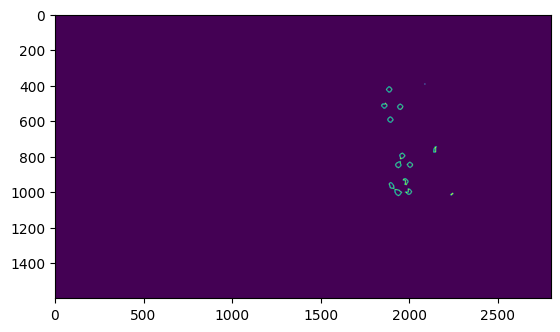

In [60]:
contours, _ = cv2.findContours(erode, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
plt.imshow(cv2.drawContours(np.zeros_like(b), contours, -1, 255, 3));

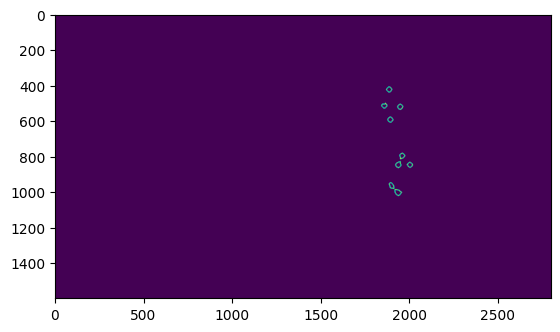

In [61]:
contours_v2 = [c for c in contours if cv2.contourArea(c) > 520]
plt.imshow(cv2.drawContours(np.zeros_like(b), contours_v2, -1, 255, 3));

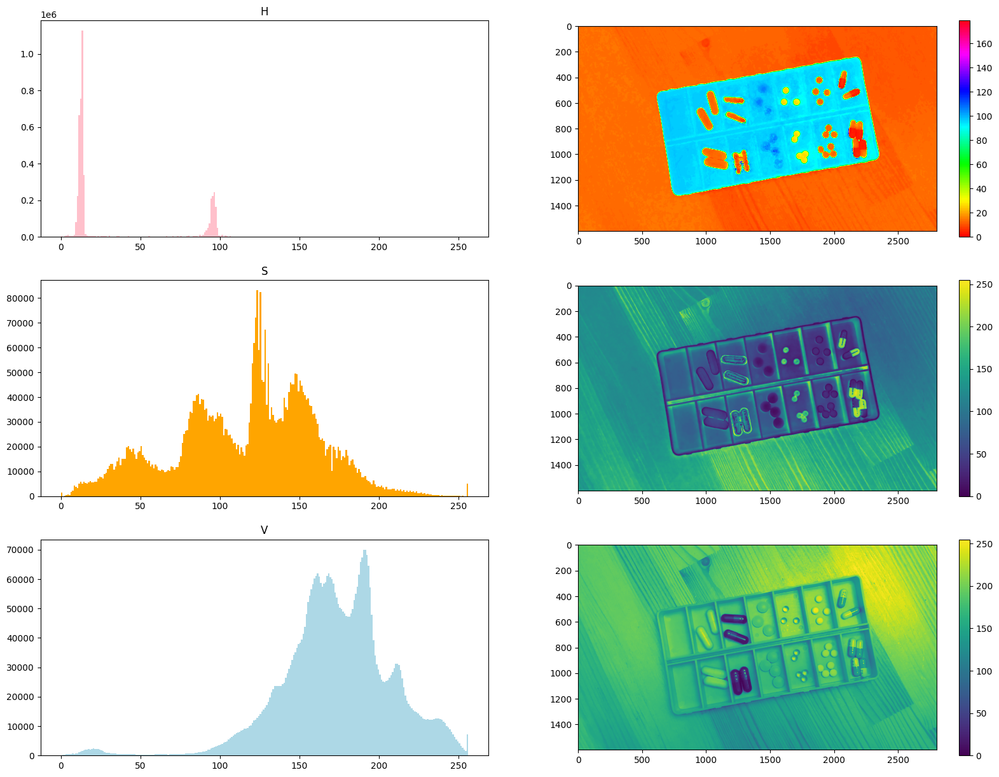

In [62]:
h,s,v = cv2.split(calib_hsv)
plt.figure(figsize=(20,15))
plt.subplot(3,2,1)
plt.hist(h.ravel(),256,[0,256], color='pink')
plt.title('H')
plt.subplot(3,2,2)
ym = plt.imshow(h, cmap='hsv')
plt.colorbar(ym)
plt.subplot(3,2,3)
plt.hist(s.ravel(),256,[0,256], color='orange')
plt.title('S')
plt.subplot(3,2,4)
um = plt.imshow(s)
plt.colorbar(um)
plt.subplot(3,2,5)
plt.hist(v.ravel(),256,[0,256], color='lightblue')
plt.title('V')
plt.subplot(3,2,6)
vm = plt.imshow(v)
plt.colorbar(vm)
plt.show()

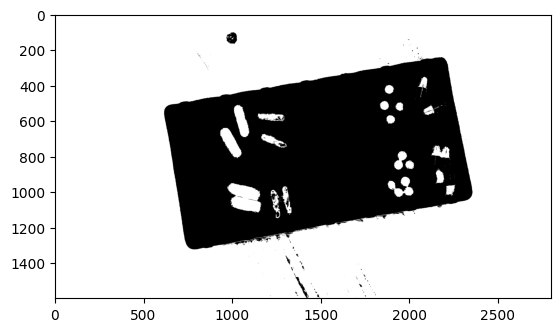

In [63]:
h,s,v = cv2.split(calib_hsv)
h_mask = cv2.inRange(h, 9, 17)
plt.imshow(h_mask, cmap='gray');

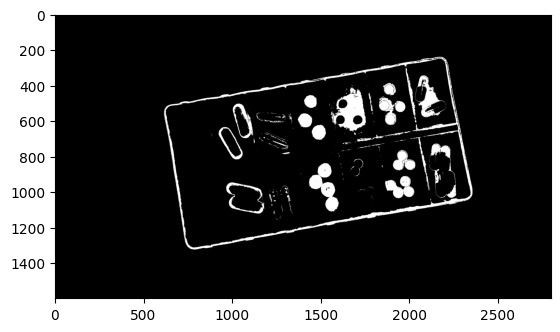

In [64]:
s_mask = cv2.inRange(s, 8,35)
plt.imshow(s_mask, cmap='gray');

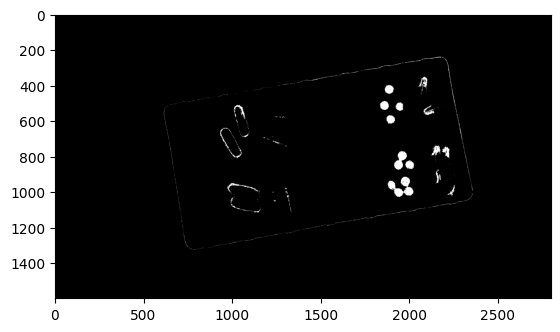

In [65]:
mask = cv2.bitwise_and(h_mask, s_mask)
plt.imshow(mask, cmap='gray');

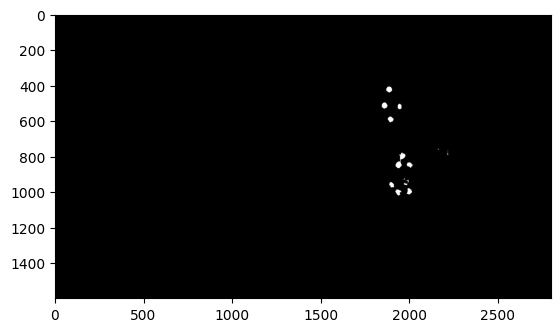

In [66]:
erode = cv2.erode(mask, np.ones((3,3), np.uint8), iterations=6)
plt.imshow(erode, cmap='gray');

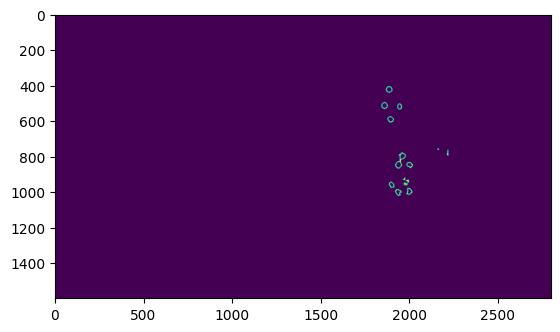

In [67]:
contours = cv2.findContours(erode, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]
plt.imshow(cv2.drawContours(np.zeros_like(b), contours, -1, 255, 3));

In [68]:
conts = []
for c in contours:
    conts.append(cv2.contourArea(c))
print(sorted(conts, reverse=True)[:11])

[1706.5, 780.5, 776.5, 683.0, 642.0, 637.0, 603.5, 539.0, 495.0, 127.0, 54.0]


In [69]:
max_size = np.max(conts)
min_size = max_size/4
print(max_size, min_size)

1706.5 426.625


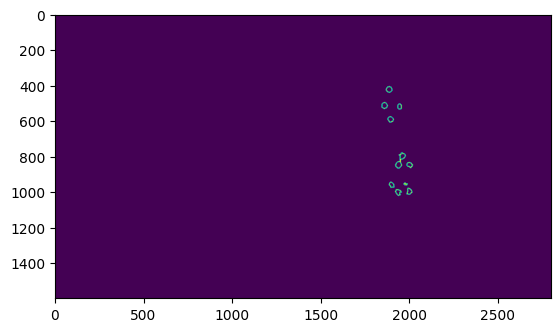

In [70]:
correct = [c for c in contours if cv2.contourArea(c) > 100]
plt.imshow(cv2.drawContours(np.zeros_like(b), correct, -1, 255, 3));

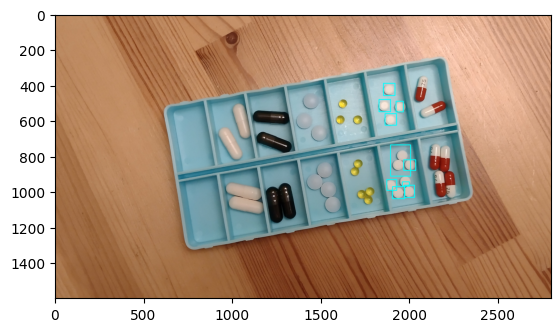

In [71]:
image = calib.copy()
for c in correct:
    x, y, w, h = cv2.boundingRect(c)
    cv2.rectangle(image, (x-int(w/2), y-int(h/2)), (x+w+int(w/2), y+h+int(h/2)), (255, 255, 0), 3)

plt.imshow(image[..., ::-1]);

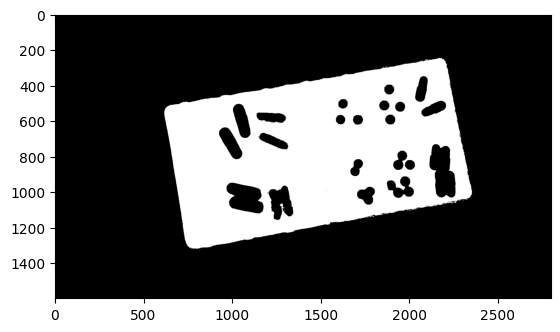

In [72]:
h,s,v = cv2.split(calib_hsv)
blue_mask = cv2.inRange(h, 80, 130)
plt.imshow(blue_mask, cmap='gray');

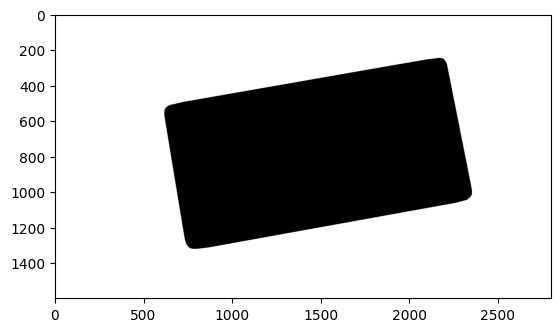

In [73]:
contours = cv2.findContours(blue_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]
# plt.imshow(cv2.drawContours(np.zeros_like(b), contours, -1, 255, 3));
hull_mask = np.zeros_like(blue_mask)
for contour in contours:
    # Get the convex hull of the contour
    hull = cv2.convexHull(contour)
    # Draw and fill the convex hull
    cv2.drawContours(hull_mask, [hull], -1, 255, thickness=cv2.FILLED)
hull_mask = ~hull_mask
plt.imshow(hull_mask, cmap='gray');

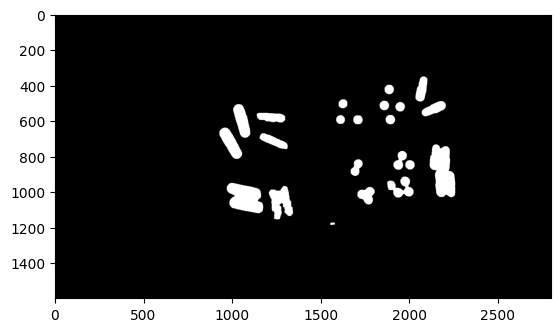

In [74]:
pills_mask = ~cv2.bitwise_or(blue_mask, hull_mask)
pills_mask = cv2.erode(pills_mask, np.ones((5,5), np.uint8), iterations=3)
pills_mask = cv2.dilate(pills_mask, np.ones((3,3), np.uint8), iterations=5)
plt.imshow(pills_mask, cmap='gray');

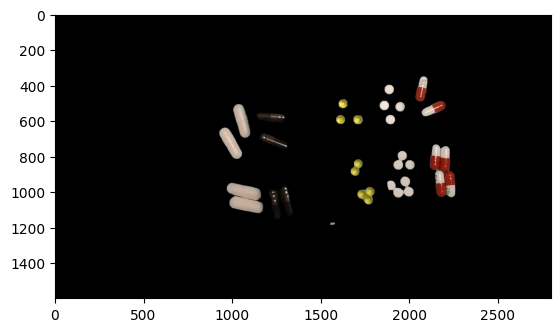

In [75]:
pills = cv2.bitwise_and(calib, calib, mask=pills_mask)
plt.imshow(pills[..., ::-1]);

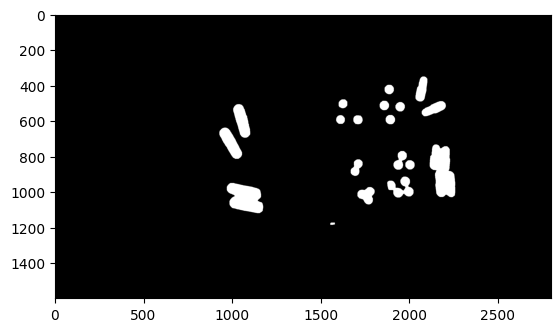

In [76]:
white_only = cv2.bitwise_and(~black_hull_mask, pills_mask)
plt.imshow(white_only, cmap='gray');

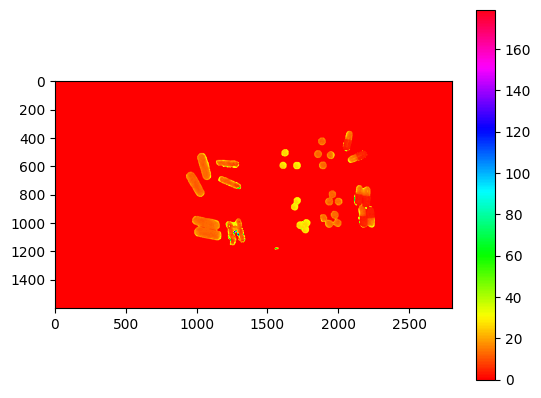

In [77]:
pills_hsv = cv2.cvtColor(pills, cv2.COLOR_BGR2HSV)
h,s,v = cv2.split(pills_hsv)
im = plt.imshow(h, cmap='hsv')
plt.colorbar(im)

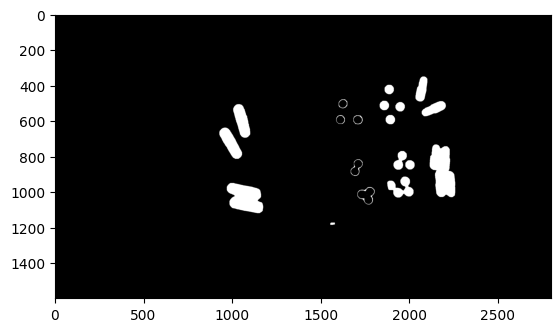

In [78]:
y,u,v = cv2.split(cv2.cvtColor(pills, cv2.COLOR_BGR2YUV))
h,s,v = cv2.split(calib_hsv)
mask_u = cv2.inRange(u, 100, 255)
# mask_red = cv2.inRange(h, 0, 5)
white_only = cv2.bitwise_and(white_only, mask_u)
# white_only = cv2.bitwise_and(white_only, ~mask_red)
plt.imshow(white_only, cmap='gray');
# plt.imshow(mask_red, cmap='gray');

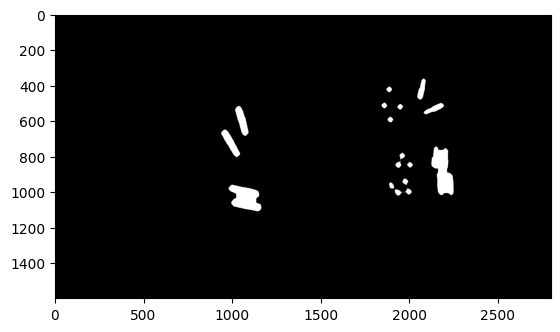

In [79]:
eroded_white = cv2.erode(white_only, np.ones((3,3), np.uint8), iterations=9)
plt.imshow(eroded_white, cmap='gray');

In [80]:
contours = cv2.findContours(eroded_white, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]
conts = []
for c in contours:
    conts.append(cv2.contourArea(c))
print(sorted(conts)[:11])

[615.0, 631.5, 641.0, 646.0, 654.5, 660.5, 731.5, 1420.0, 1613.0, 2973.0, 3126.0]


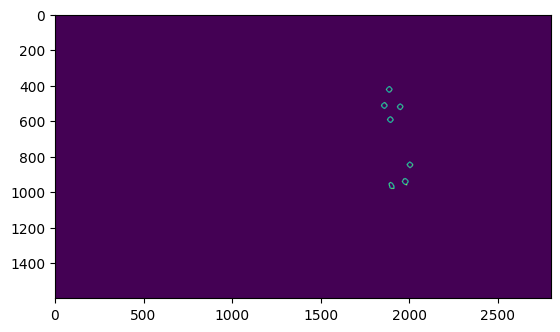

In [81]:
small = [c for c in contours if cv2.contourArea(c) < 1000]
plt.imshow(cv2.drawContours(np.zeros_like(b), small, -1, 255, 3));

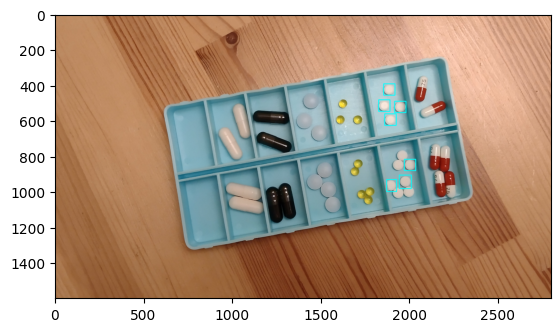

In [82]:
image = calib.copy()
for c in small:
    x, y, w, h = cv2.boundingRect(c)
    cv2.rectangle(image, (x-int(w/2), y-int(h/2)), (x+w+int(w/2), y+h+int(h/2)), (255, 255, 0), 3)
plt.imshow(image[..., ::-1]);

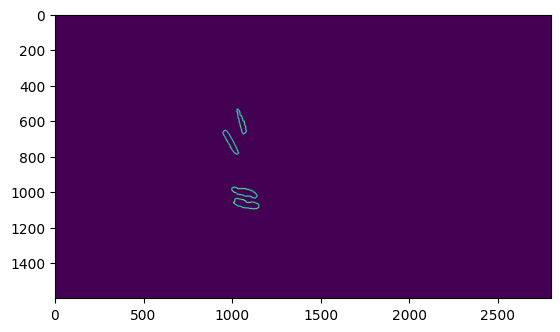

In [83]:
# white_pills
plt.imshow(cv2.drawContours(np.zeros_like(b), white_pills, -1, 255, 3));

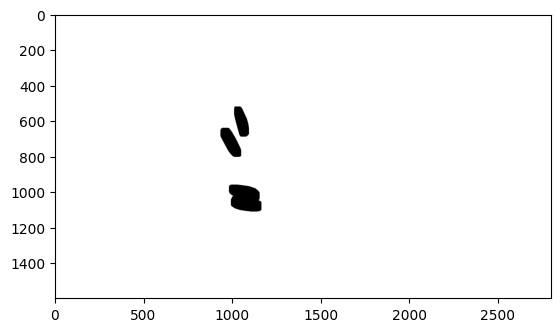

In [84]:
# contours = cv2.findContours(blue_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]
# plt.imshow(cv2.drawContours(np.zeros_like(b), contours, -1, 255, 3));
hull_mask = np.zeros_like(eroded_white)
for contour in white_pills:
    # Get the convex hull of the contour
    hull = cv2.convexHull(contour)
    # Draw and fill the convex hull
    cv2.drawContours(hull_mask, [hull], -1, 255, thickness=cv2.FILLED)

hull_mask = cv2.dilate(hull_mask, np.ones((5,5), np.uint8), iterations=7)
hull_mask = ~hull_mask
plt.imshow(hull_mask, cmap='gray');

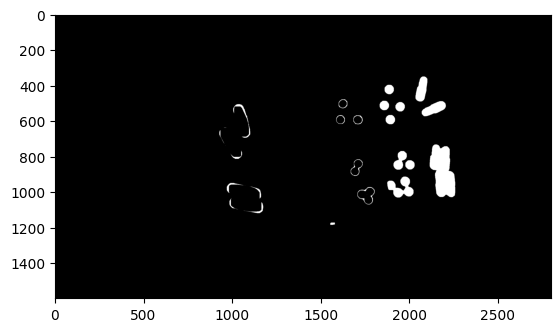

In [85]:
white_only = cv2.bitwise_and(white_only, hull_mask)
plt.imshow(white_only, cmap='gray');

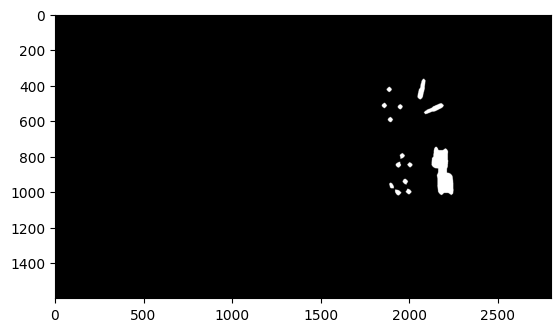

In [92]:
eroded_white = cv2.erode(white_only, np.ones((3,3), np.uint8), iterations=10)
plt.imshow(eroded_white, cmap='gray');

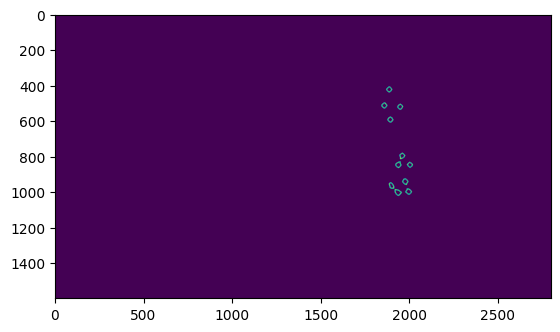

In [93]:
contours = cv2.findContours(eroded_white, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]
small = [c for c in contours if cv2.contourArea(c) < 1000]
small = [c for c in small if cv2.contourArea(c) > 300]
plt.imshow(cv2.drawContours(np.zeros_like(b), small, -1, 255, 3));